In [2]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 32.5 MB/s eta 0:00:0000:0100:01


In [3]:
import os
import shutil
import scipy.io as sio
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch.nn.functional as F

import xml.etree.ElementTree as ET
from PIL import Image, ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [4]:
"""
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/lists.tar

print("데이터 다운로드 완료!")
"""

--2025-09-03 06:29:04--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar.1’

images.tar.1          0%[                    ]   1.53M   442KB/s    eta 31m 47s^C
--2025-09-03 06:29:09--  http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21852160 (21M) [application/x-tar]
Saving to: ‘annotation.tar.1’

annotation.tar.1      3%[                    ] 703.70K   369KB/s               ^C
--2025-09-03 06:29:11--  http://vision.stanford.edu/aditya86/ImageNetDogs/lists.tar
Resolving vision.stanford.ed

In [13]:
"""
!tar -xf images.tar -C ~/work/class_activation_map/
!tar -xf annotation.tar -C ~/work/class_activation_map/
!tar -xf lists.tar -C ~/work/class_activation_map/
"""

In [5]:
# 원본 데이터 경로 (압축 해제 후 폴더)
images_dir = os.path.join(os.getenv("HOME"), '/home/jovyan/work/class_activation_map/Images')   # 이미지들이 위치한 폴더
mat_dir = os.path.join(os.getenv("HOME"), '/home/jovyan/work/class_activation_map')   # 프로젝트 루트 디렉토리

# .mat 파일 경로 (train_list.mat와 test_list.mat가 각각 같은 구조라고 가정)
train_mat_path = os.path.join(mat_dir, 'train_list.mat')
test_mat_path = os.path.join(mat_dir, 'test_list.mat')

# .mat 파일 로드
train_mat = sio.loadmat(train_mat_path)
test_mat = sio.loadmat(test_mat_path)

# train_mat와 test_mat 내부에 'file_list'와 'labels' 등이 있음
train_file_list = train_mat['file_list']
train_labels = train_mat['labels'].squeeze()  # (N,)
test_file_list = test_mat['file_list']
test_labels = test_mat['labels'].squeeze()

# 최종적으로 ImageFolder 구조로 재구성할 대상 폴더 생성 (예: stanford_dogs/train, stanford_dogs/test)
base_dir = 'stanford_dogs'
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

def process_mat_file(file_list_array, split_dir):
    """
    .mat 파일에서 로드한 file_list_array를 사용해,
    split_dir(예: train 혹은 test)에 클래스별 폴더를 생성하고 이미지를 복사합니다.
    """
    num_files = file_list_array.shape[0]
    for idx in range(num_files):
        # file_list_array[idx]는 보통 array([<파일경로>]) 형태입니다.
        # 따라서, array([<파일경로>]).item()을 사용하면 실제 문자열을 얻을 수 있습니다.
        file_path = file_list_array[idx][0].item()

        # 혹시 bytes 타입이면 문자열로 디코딩
        if isinstance(file_path, bytes):
            file_path = file_path.decode('utf-8')

        # 파일 경로 예시: 'n02116738-African_hunting_dog/n02116738_2988.jpg'
        # 클래스 이름은 파일 경로의 최상위 폴더명 (예: 'n02116738-African_hunting_dog')
        class_folder = file_path.split('/')[0]

        # 대상 클래스 폴더 생성
        dest_folder = os.path.join(split_dir, class_folder)
        os.makedirs(dest_folder, exist_ok=True)

        # 원본 이미지 경로: Images 폴더 아래에 file_path 위치
        src_path = os.path.join(images_dir, file_path)
        # 대상 이미지 경로: dest_folder 아래에 원본 파일명 그대로 복사
        dest_path = os.path.join(dest_folder, os.path.basename(file_path))

        # 파일 존재 여부 확인 후 복사
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
        else:
            print(f"File not found: {src_path}")

print("Processing train set...")
process_mat_file(train_file_list, train_dir)
print("Processing test set...")
process_mat_file(test_file_list, test_dir)

print("Dataset reorganization complete.")

Processing train set...
Processing test set...
Dataset reorganization complete.


In [6]:
class StanfordDogsDatasetWithBBox(datasets.ImageFolder):
    def __init__(self, root, annotation_root, transform=None):
        super().__init__(root, transform=transform)
        self.annotation_root = annotation_root  # 예: '/content/Annotation'
        self.new_size = (224, 224)

    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        path, _ = self.samples[index]

        rel_path = os.path.relpath(path, self.root)
        annot_filename = os.path.splitext(os.path.basename(rel_path))[0]
        annot_folder = os.path.dirname(rel_path)
        annot_path = os.path.join(self.annotation_root, annot_folder, annot_filename)

        # bbox 기본값 (예: [ymin, xmin, ymax, xmax])
        bbox = [0.0, 0.0, 0.0, 0.0]

        if os.path.exists(annot_path):
            try:
                # 확장자가 없지만 XML 형식의 파일이라고 가정하고 파싱
                tree = ET.parse(annot_path)
                root_xml = tree.getroot()
                # 첫 번째 object 태그에서 bndbox 정보를 읽음
                obj = root_xml.find('object')
                if obj is not None:
                    bndbox = obj.find('bndbox')
                    if bndbox is not None:
                        xmin = float(bndbox.find('xmin').text)
                        ymin = float(bndbox.find('ymin').text)
                        xmax = float(bndbox.find('xmax').text)
                        ymax = float(bndbox.find('ymax').text)
                        # XML 내 <size> 태그에서 원본 이미지 크기 획득
                        size = root_xml.find('size')
                        w = float(size.find('width').text)
                        h = float(size.find('height').text)
                        new_h, new_w = self.new_size
                        # bbox 좌표 순서: [ymin, xmin, ymax, xmax]
                        bbox = [xmin * (new_w / w), ymin * (new_h / h),
                                xmax * (new_w / w), ymax * (new_h / h)]
                    else:
                        print(f"bndbox 태그를 찾을 수 없습니다: {annot_path}")
                else:
                    print(f"object 태그를 찾을 수 없습니다: {annot_path}")
            except Exception as e:
                print(f"Error parsing {annot_path}: {e}")
        else:
            print(f"Annotation file not found: {annot_path}")

        return image, label, bbox

In [7]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# 데이터셋 경로 (재구성한 ImageFolder 형식)
train_dir = os.path.join('stanford_dogs', 'train')
test_dir = os.path.join('stanford_dogs', 'test')
# Annotation 폴더 경로 (예: '/root/Annotation')
annotation_dir = os.path.join(os.getenv("HOME"), 'work/class_activation_map/Annotation')

# 커스텀 데이터셋 생성: image, label, bbox 반환
train_dataset = StanfordDogsDatasetWithBBox(root=train_dir, annotation_root=annotation_dir, transform=transform)
valid_dataset = StanfordDogsDatasetWithBBox(root=test_dir, annotation_root=annotation_dir, transform=transform)

batch_size = 12
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

num_classes = len(train_dataset.classes)
print(f"Number of classes: {num_classes}")
print(f"Train samples: {len(train_dataset)}")
print(f"Test samples: {len(valid_dataset)}")

Number of classes: 120
Train samples: 12000
Test samples: 8580


In [8]:
def visualize(sample):
    img_tensor, label, bbox = sample

    # 인덱스와 클래스 정보
    print("Label index:", label)
    print("Class name:", train_dataset.classes[label])

    # 정규화 복원 전처리 시 사용한 평균과 표준편차
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # tensor의 shape: (C, H, W) -> (H, W, C)
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = std * img_np + mean
    img_np = np.clip(img_np, 0, 1)

    plt.figure(figsize=(6,6))
    plt.imshow(img_np)
    plt.title(f"Class: {train_dataset.classes[label]}")
    plt.axis('off')
    plt.show()

Label index: 0
Class name: n02085620-Chihuahua


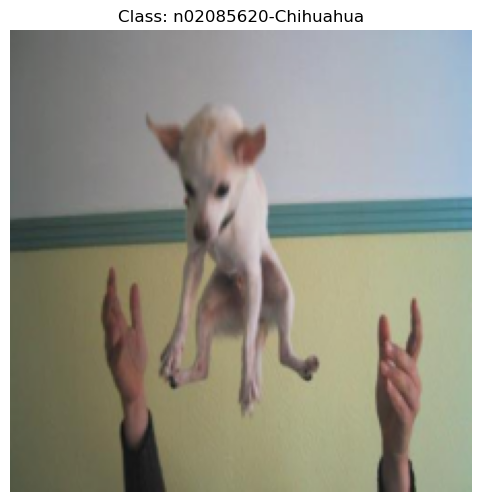

In [9]:
# 임의의 한 샘플 선택 (여기서는 첫 번째 샘플을 사용)
train_sample = train_dataset[0]

visualize(train_sample)

Label index: 0
Class name: n02085620-Chihuahua


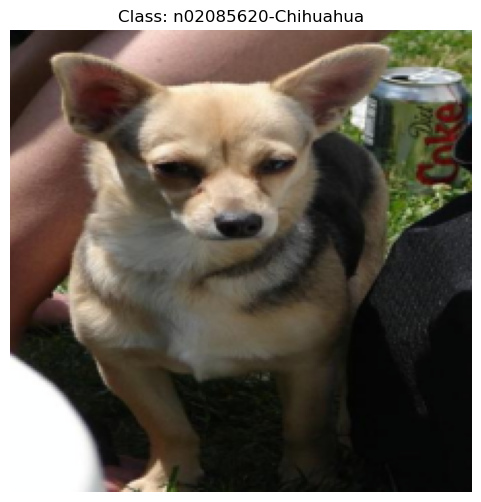

In [10]:
# 임의의 한 샘플 선택 (여기서는 첫 번째 샘플을 사용)
test_sample = valid_dataset[0]

visualize(test_sample)

In [11]:
# Annotation 폴더에서 데이터를 골라보세요
annotation_path = os.path.join(os.getenv("HOME"), 'work/class_activation_map/Annotation/n02085620-Chihuahua/n02085620_10074')


# XML 파일 파싱
tree = ET.parse(annotation_path)
root = tree.getroot()

for elem in root.iter():
    print(f"{elem.tag}: {elem.text}")

annotation: 
	
folder: 02085620
filename: n02085620_10074
source: 
		
database: ImageNet database
size: 
		
width: 333
height: 500
depth: 3
segment: 0
object: 
		
name: Chihuahua
pose: Unspecified
truncated: 0
difficult: 0
bndbox: 
			
xmin: 25
ymin: 10
xmax: 276
ymax: 498


In [12]:
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(train_dataset.classes))
model = model.to(device)

/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home/jovyan/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 56.8MB/s]


In [13]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [16]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

In [17]:
def train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=2):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        print(f"\nEpoch {epoch+1}/{num_epochs} 시작")
        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()
            if (batch_idx + 1) % 50 == 0:
                print(f"  Step {batch_idx+1} - Loss: {loss.item():.4f}")

        train_loss = running_loss / (batch_idx + 1)
        train_acc = correct / total
        print(f"Train - Loss: {train_loss:.4f}, Accuracy: {train_acc*100:.2f}%")

        # 검증 단계
        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels, _ in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss += loss.item()
                _, preds = torch.max(outputs, 1)
                total += labels.size(0)
                correct += (preds == labels).sum().item()
        test_loss = running_loss / len(valid_loader)
        test_acc = correct / total
        print(f"Validation - Loss: {test_loss:.4f}, Accuracy: {test_acc*100:.2f}%")

In [18]:
%%time

train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=2)


Epoch 1/2 시작
  Step 50 - Loss: 4.1674
  Step 100 - Loss: 3.2041
  Step 150 - Loss: 4.1348
  Step 200 - Loss: 3.9432
  Step 250 - Loss: 3.5100
  Step 300 - Loss: 3.5361
  Step 350 - Loss: 3.5540
  Step 400 - Loss: 3.4135
  Step 450 - Loss: 3.7669
  Step 500 - Loss: 2.8260
  Step 550 - Loss: 2.6237
  Step 600 - Loss: 2.6793
  Step 650 - Loss: 3.0801
  Step 700 - Loss: 2.7423
  Step 750 - Loss: 3.8505
  Step 800 - Loss: 2.2345
  Step 850 - Loss: 3.4308
  Step 900 - Loss: 1.9985
  Step 950 - Loss: 3.1193
  Step 1000 - Loss: 2.6732
Train - Loss: 3.2381, Accuracy: 21.88%
Validation - Loss: 2.6880, Accuracy: 32.40%

Epoch 2/2 시작
  Step 50 - Loss: 3.0760
  Step 100 - Loss: 1.7327
  Step 150 - Loss: 1.5593
  Step 200 - Loss: 2.9970
  Step 250 - Loss: 2.9910
  Step 300 - Loss: 2.4228
  Step 350 - Loss: 1.7699
  Step 400 - Loss: 1.9973
  Step 450 - Loss: 2.2980
  Step 500 - Loss: 2.4896
  Step 550 - Loss: 1.7116
  Step 600 - Loss: 2.1626
  Step 650 - Loss: 3.2119
  Step 700 - Loss: 3.0632
  Step

In [43]:
# Q. '/work/class_activation_map' 에 'cam_model1.h5'을 저장하세요.

cam_model_path = os.path.join(os.getenv("HOME"), "work/class_activation_map/cam_model.pt")

torch.save(model, cam_model_path)

AttributeError: Can't get local object 'generate_cam.<locals>.hook'

In [20]:
# Q. '/work/class_activation_map' 에 'cam_model1.h5'을 저장하세요.

cam_model_path1 = os.path.join(os.getenv("HOME"), "work/class_activation_map/cam_model1.pt")
# 가중치만 저장
torch.save(model.state_dict(), cam_model_path1)
print(f"Model weights saved successfully at {cam_model_path1}")

Model weights saved successfully at /home/jovyan/work/class_activation_map/cam_model1.pt


In [21]:
cam_model_path2 = os.path.join(os.getenv("HOME"), "work/class_activation_map/cam_model2.pt")

# 디렉토리 확인 및 생성
os.makedirs(os.path.dirname(cam_model_path2), exist_ok=True)

# 모델 저장
torch.save(model, cam_model_path2)
print(f"Model saved successfully at {cam_model_path2}")
# 저장 후 파일 존재 확인
print(f"File exists: {os.path.exists(cam_model_path2)}")

Model saved successfully at /home/jovyan/work/class_activation_map/cam_model2.pt
File exists: True


In [24]:
cam_model_path = os.path.join(os.getenv("HOME"), "work/class_activation_map/cam_model.pt")

# 파일 존재 여부 확인
if not os.path.exists(cam_model_path):
    raise FileNotFoundError(f"Model file not found at {cam_model_path}")

# 모델 로드
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.load(cam_model_path, map_location=device)
model.eval()  # 평가 모드로 전환 (CAM/Grad-CAM 사용 시 필요)
model = model.to(device)

UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, [1mdo those steps only if you trust the source of the checkpoint[0m. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL torchvision.models.resnet.ResNet was not an allowed global by default. Please use `torch.serialization.add_safe_globals([torchvision.models.resnet.ResNet])` or the `torch.serialization.safe_globals([torchvision.models.resnet.ResNet])` context manager to allowlist this global if you trust this class/function.

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

In [44]:
def unnormalize(img_tensor):
    """
    img_tensor: [C, H, W] 텐서 (전처리 상태, 예: normalization 적용됨)
    ImageNet 평균 및 표준편차를 이용하여 복원 (RGB 순서)
    """
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    img = np.uint8(255 * img)
    return img

In [45]:
# 원하는 데이터를 골라서 진행해보세요

image, label, bbox = train_dataset[0]
sample_image = image.unsqueeze(0).to(device)

In [47]:
# 모델을 불러오세요

# [[YOUR CODE]]
model = torch.load(cam_model_path, weights_only=False)

RuntimeError: PytorchStreamReader failed locating file data.pkl: file not found

In [61]:
def generate_cam(model, image):
    model.eval()
    features = []

    def hook(module, input, output):
        features.append(output.detach())
    hook_handle = model.layer4.register_forward_hook(hook)

    output = model(image)
    hook_handle.remove()

    # 예측된 클래스 선택 (배치의 첫 번째 이미지 기준)
    pred_class = output.argmax(dim=1).item()

    # 모델의 fc layer 가중치가 모델과 동일한 디바이스에 있도록 처리
    fc_weights = model.fc.weight.data.to(image.device)

    # features[0]: shape [1, num_features, H, W]
    fmap = features[0][0]  # 첫 번째 이미지의 feature map
    cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=image.device)

    # fc 가중치와 feature map의 각 채널을 가중합
    for i, w in enumerate(fc_weights[pred_class]):
        cam += w * fmap[i, :, :]
    cam = cam.cpu().numpy()

    # CAM 정규화
    cam = np.maximum(cam, 0)
    cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam) + 1e-8)

    return cam

In [62]:
cam = generate_cam(model, sample_image)

In [50]:
def visualize_cam(cam):
    plt.imshow(cam, cmap='jet')
    plt.colorbar()
    plt.title("CAM")
    plt.axis('off')
    plt.show()

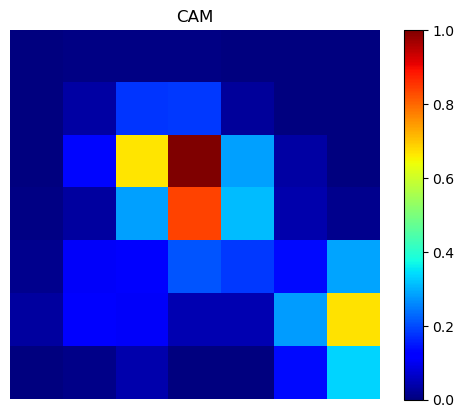

In [51]:
visualize_cam(cam)

In [52]:
def visualize_cam_on_image(cam, img, alpha=0.5):
    # CAM 크기를 원본 이미지 크기로 조정
    cam_resized = cv2.resize(cam, (img.shape[1], img.shape[0]))

    # CAM을 컬러 heatmap으로 변환 (cv2.applyColorMap는 BGR로 반환하므로 RGB로 변경)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # 원본 이미지와 heatmap을 alpha blending
    overlay = heatmap * alpha + img * (1 - alpha)
    overlay = overlay.astype(np.uint8)

    plt.figure(figsize=(8,8))
    plt.imshow(overlay)
    plt.title("CAM Overlay on Image")
    plt.axis('off')
    plt.show()

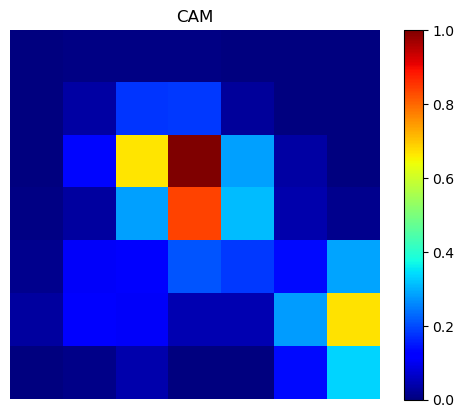

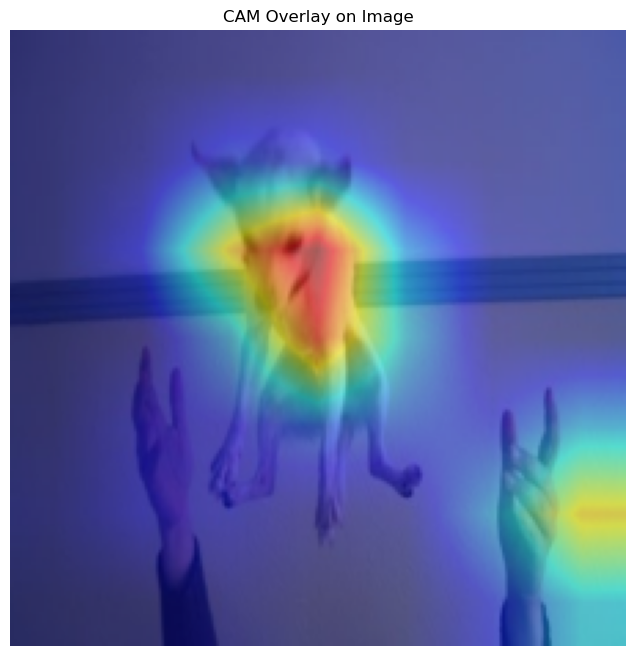

In [53]:
# 원본 이미지 복원
orig_img = unnormalize(image)

# CAM 단독 시각화
visualize_cam(cam)

# 원본 이미지 위에 CAM overlay 시각화
visualize_cam_on_image(cam, orig_img)

In [ ]:
# 4. Grad-CAM

In [ ]:
"""
이번에는 Grad-CAM을 이용해서 CAM을 만들어 봅시다.

grad_cam은 관찰을 원하는 레이어와 정답 클래스에 대한 예측값 사이의 그래디언트를 구하고, 여기에 GAP 연산을 적용함으로써 관찰 대상이 되는 레이어의 채널별 가중치를 구합니다. 최종 CAM 이미지를 구하기 위해서는 레이어의 채널별 가중치(weights)와 레이어에서 나온 채널별 특성 맵을 가중합해주어 cam_image를 얻게 됩니다.

이전 스텝에서 본 CAM 함수와 달리, Grad-CAM은 이번에는 어떤 레이어든 CAM 이미지를 뽑아낼 수 있으므로, 그래디언트 계산을 원하는 관찰 대상 레이어 activation_layer를 뽑아서 쓸 수 있도록 activation_layer의 이름을 받고 이를 활용해야 합니다.

아래 generate_grad_cam()에서는 원하는 레이어의 output과 특정 클래스의 prediction 사이의 그래디언트 grad_val을 얻고 이를 weights로 활용합니다.
"""

In [41]:
def generate_grad_cam(model, image, target_layer_name):
    model.eval()
    features = {}
    gradients = {}

    # forward hook: 대상 레이어의 출력을 저장
    def forward_hook(module, input, output):
        features['value'] = output.detach()

    # backward hook: 대상 레이어의 gradient를 저장
    def backward_hook(module, grad_in, grad_out):
        gradients['value'] = grad_out[0].detach()

    # 모델 내에서 이름이 target_layer_name과 일치하는 레이어 검색
    target_layer = dict(model.named_modules()).get(target_layer_name, None)
    if target_layer is None:
        raise ValueError(f"Layer '{target_layer_name}' not found in the model.")

    # hook 등록
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # 순전파 실행
    output = model(image)
    pred_class = output.argmax(dim=1).item()

    # 예측 클래스에 대해 backward 수행
    model.zero_grad()
    score = output[0, pred_class]
    score.backward()

    # hook 제거
    forward_handle.remove()
    backward_handle.remove()

    # 저장된 feature map과 gradient 추출 (shape: [C, H, W])
    fmap = features['value'][0]
    grads = gradients['value'][0]

    # 각 채널에 대해 gradient의 global average pooling 계산 (weight 역할)
    weights = torch.mean(grads, dim=(1, 2))

    # weighted sum: 각 채널의 feature map에 weight를 곱해 합산
    grad_cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=fmap.device)
    for i, w in enumerate(weights):
        grad_cam += w * fmap[i, :, :]
    grad_cam = grad_cam.cpu().numpy()

    # ReLU 적용 및 정규화: 음수 값 제거 및 [0,1] 범위로 스케일링
    grad_cam = np.maximum(grad_cam, 0)
    grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min() + 1e-8)

    return grad_cam

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


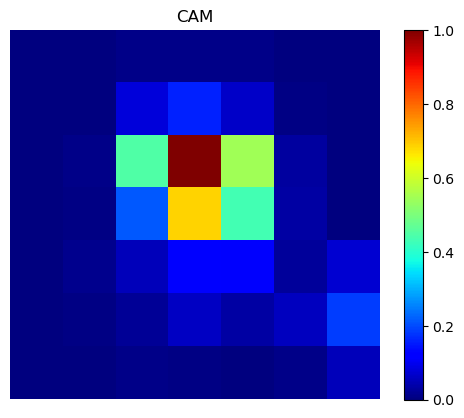

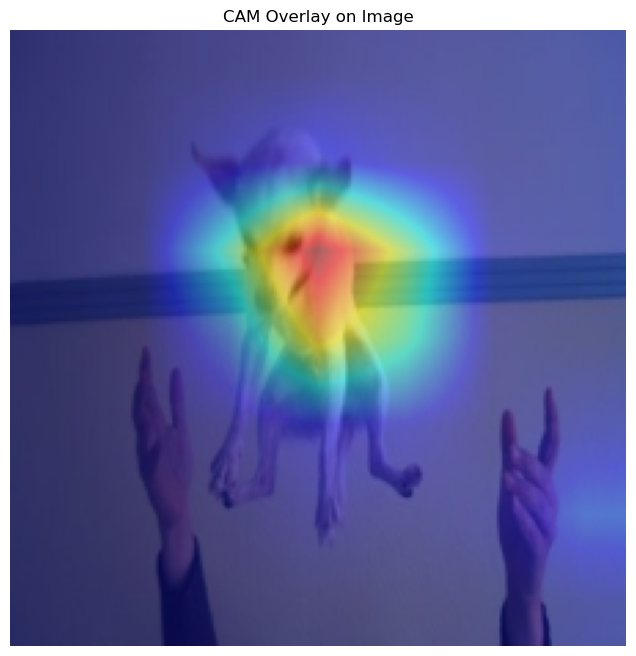

In [42]:
# layer4 사용
grad_cam = generate_grad_cam(model, sample_image, target_layer_name="layer4")

# Grad-CAM 단독 시각화
visualize_cam(grad_cam)

# 전처리된 이미지를 원본 이미지로 복원 후 overlay 시각화
orig_img = unnormalize(image)
visualize_cam_on_image(grad_cam, orig_img)

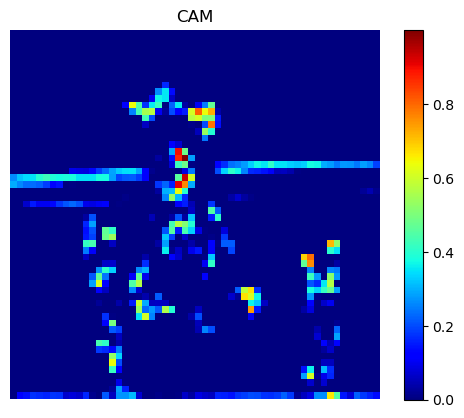

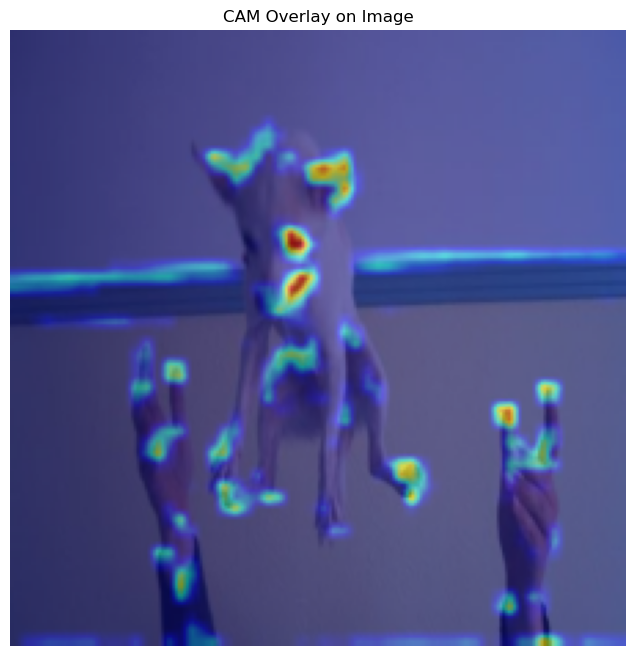

In [43]:
grad_cam = generate_grad_cam(model, sample_image, target_layer_name="layer1")

# Grad-CAM 단독 시각화
visualize_cam(grad_cam)

# 전처리된 이미지를 원본 이미지로 복원 후 overlay 시각화
orig_img = unnormalize(image)
visualize_cam_on_image(grad_cam, orig_img)

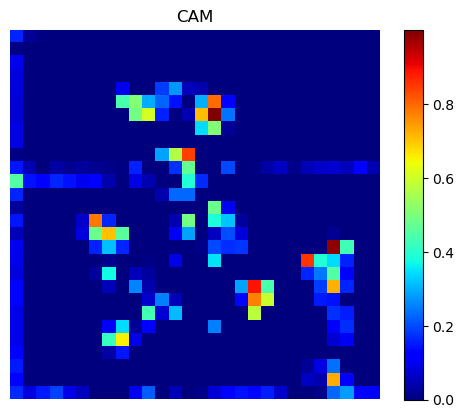

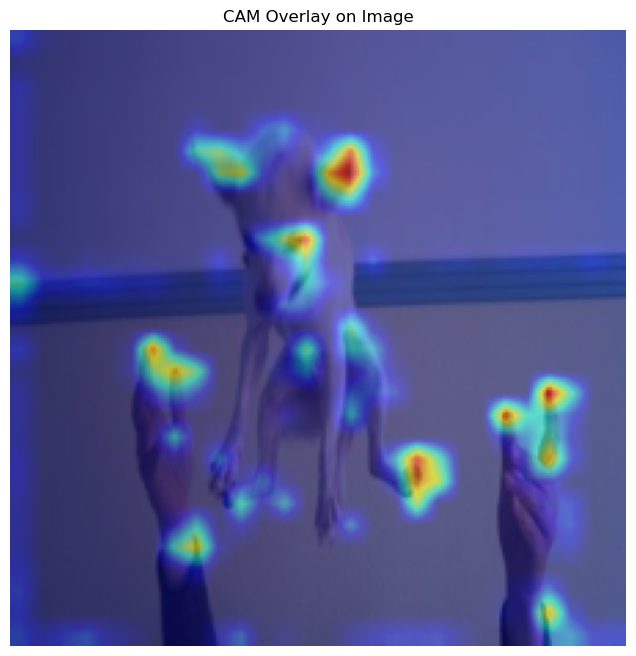

In [44]:
grad_cam = generate_grad_cam(model, sample_image, target_layer_name="layer2")

# Grad-CAM 단독 시각화
visualize_cam(grad_cam)

# 전처리된 이미지를 원본 이미지로 복원 후 overlay 시각화
orig_img = unnormalize(image)
visualize_cam_on_image(grad_cam, orig_img)

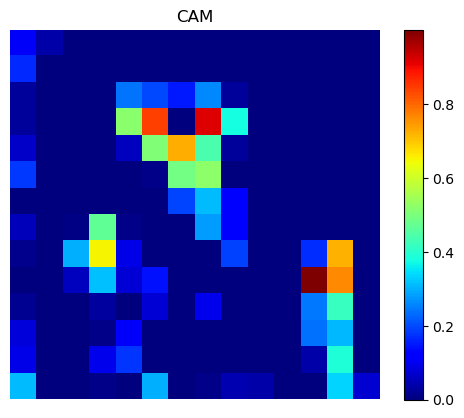

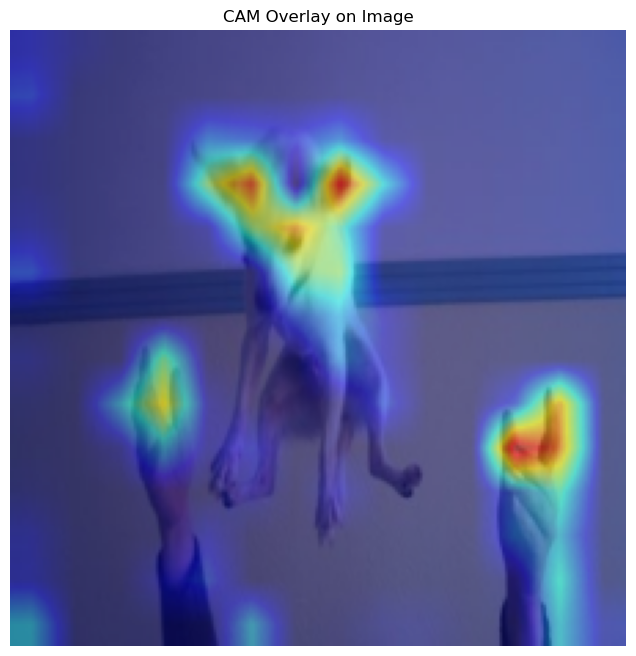

In [45]:
grad_cam = generate_grad_cam(model, sample_image, target_layer_name="layer3")

# Grad-CAM 단독 시각화
visualize_cam(grad_cam)

# 전처리된 이미지를 원본 이미지로 복원 후 overlay 시각화
orig_img = unnormalize(image)
visualize_cam_on_image(grad_cam, orig_img)

In [ ]:
## 5. Detection with CAM

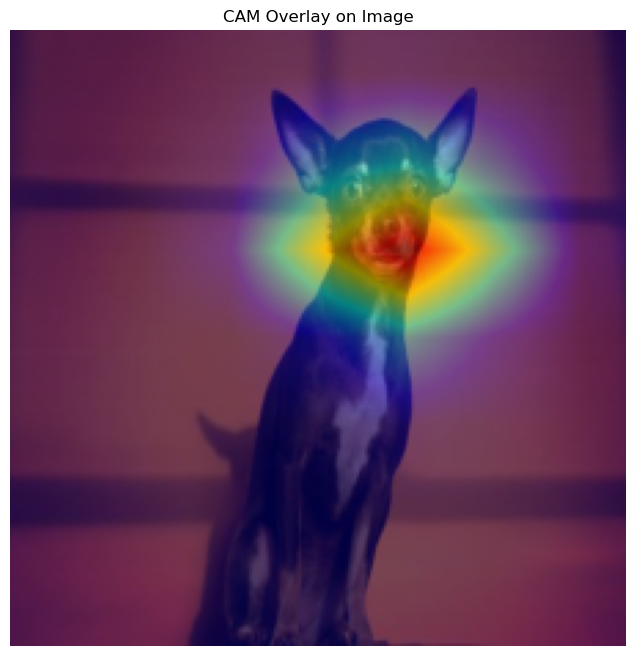

In [46]:
image, label, ground_bbox = train_dataset[10]
sample_image = image.unsqueeze(0).to(device)
orig_img = unnormalize(image)
grad_cam = generate_grad_cam(model, sample_image, target_layer_name="layer4")

visualize_cam_on_image(grad_cam, orig_img)

In [47]:
def get_bbox(cam, threshold=0.01):
    coords = np.argwhere(cam > threshold)
    if coords.size == 0:
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    return (x_min, y_min, x_max, y_max)

In [48]:
cam_resized = cv2.resize(cam, (orig_img.shape[1], orig_img.shape[0]))
bbox = get_bbox(cam_resized, threshold=0.5)

print(bbox)

(np.int64(83), np.int64(61), np.int64(146), np.int64(121))


In [49]:
def visualize_bbox_on_image(img, bbox, box_color=(255, 0, 0), thickness=2):
    # 원본 이미지 복사
    img_with_bbox = img.copy()
    if bbox is not None:
        x_min, y_min, x_max, y_max = bbox
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), box_color, thickness)
    else:
        print("활성화된 영역이 없습니다.")
    return img_with_bbox

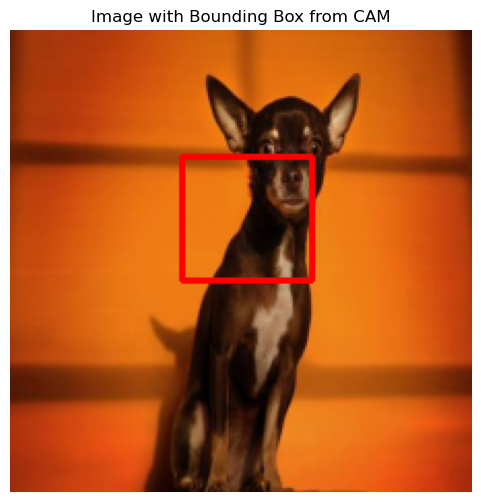

In [50]:
img_bbox = visualize_bbox_on_image(orig_img, bbox)

plt.figure(figsize=(6,6))
plt.imshow(img_bbox)
plt.title("Image with Bounding Box from CAM")
plt.axis("off")
plt.show()

In [51]:
ground_bbox

[78.848, 19.333333333333332, 169.792, 222.0]

In [52]:
def get_iou(bbox1, bbox2):
    # bbox 중 하나라도 None이면 IoU 0.0
    if bbox1 is None or bbox2 is None:
        return 0.0

    x_min1, y_min1, x_max1, y_max1 = bbox1
    x_min2, y_min2, x_max2, y_max2 = bbox2

    # 두 bbox의 교집합 영역 좌표 계산
    x_min_inter = max(x_min1, x_min2)
    y_min_inter = max(y_min1, y_min2)
    x_max_inter = min(x_max1, x_max2)
    y_max_inter = min(y_max1, y_max2)

    # 교집합의 너비와 높이 (음수가 되지 않도록)
    inter_width = max(0, x_max_inter - x_min_inter)
    inter_height = max(0, y_max_inter - y_min_inter)
    inter_area = inter_width * inter_height

    # 각 bbox의 면적 계산
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)

    # 합집합 면적: A ∪ B = A + B - A ∩ B
    union_area = area1 + area2 - inter_area
    if union_area <= 0:
        return 0.0

    iou = inter_area / union_area
    return iou

In [53]:
get_iou(bbox, ground_bbox)

np.float64(0.20508572076743584)

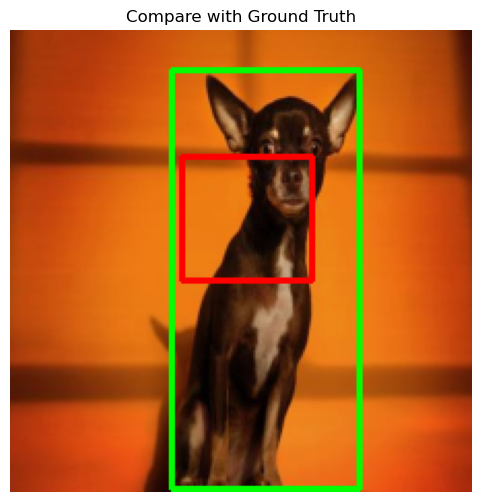

In [54]:
def visualize_both_bbox_on_image(img, bbox, ground_truth, thickness=2):
    # 원본 이미지 복사
    img_with_bbox = img.copy()

    x_min, y_min, x_max, y_max = bbox
    cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), thickness)

    x_min_t, y_min_t, x_max_t, y_max_t = ground_truth
    cv2.rectangle(img_with_bbox, (x_min_t, y_min_t), (x_max_t, y_max_t), (0, 255, 0), thickness)

    return img_with_bbox

ground_truth = [int(x) for x in ground_bbox]

img_bbox = visualize_both_bbox_on_image(orig_img, bbox, ground_truth)

plt.figure(figsize=(6,6))
plt.imshow(img_bbox)
plt.title("Compare with Ground Truth")
plt.axis("off")
plt.show()

In [ ]:
##########################################################
#           프로젝트: CAM을 만들고 평가해 보자            #
##########################################################

In [55]:
import torch
import numpy as np
import cv2
import PIL

print(torch.__version__)
print(np.__version__)
print(cv2.__version__)
print(PIL.__version__)

2.7.1+cu118
2.2.6
4.12.0
11.2.1


In [ ]:
##########################################################
#                     CAM 구현하기                       #
##########################################################
# 1.이번 노드에 나왔던 CAM을 직접 구현해 봅시다. 예제 코드를 최대한 보지 말고, 설명과 이론을 보고 구현해 보세요.

In [77]:
def unnormalize(img_tensor):
    """
    img_tensor: [C, H, W] 텐서 (전처리 상태, 예: normalization 적용됨)
    ImageNet 평균 및 표준편차를 이용하여 복원 (RGB 순서)
    """
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    img = np.uint8(255 * img)
    return img

In [100]:
# 원하는 데이터를 골라서 진행해보세요
image, label, bbox = train_dataset[10]
sample_image = image.unsqueeze(0).to(device)

In [101]:
def generate_cam(model, image):
    model.eval()
    # 마지막 conv feature를 꺼내기 위해 hook 걸기
    features = []
    def hook(module, input, output):    # forward hook 함수
        features.append(output.detach())    # feature map 저장
    
    # ResNet-50의 마지막 conv layer (layer4)
    hook_handle = model.layer4.register_forward_hook(hook)  # layer4에 hook 등록

    output = model(image)   # forward pass
    hook_handle.remove()    # hook 제거

    # 예측된 클래스 선택 (배치의 첫 번째 이미지 기준)
    pred_class = output.argmax(dim=1).item()

    # 모델의 fc layer 가중치가 모델과 동일한 디바이스에 있도록 처리
    fc_weights = model.fc.weight.data.to(image.device)  # 모델의 fc layer 가중치

    # features[0]: shape [1, num_features, H, W]
    fmap = features[0][0]  # 첫 번째 이미지의 feature map
    cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=image.device) # CAM 초기화

    # fc 가중치와 feature map의 각 채널을 가중합
    for i, w in enumerate(fc_weights[pred_class]):  # i: 채널 인덱스, w: 해당 채널의 fc 가중치
        cam += w * fmap[i, :, :]    # CAM 계산
    
    cam = cam.cpu().numpy() # CAM을 numpy 배열로 변환

    # CAM 정규화
    cam = np.maximum(cam, 0)    # ReLU
    cam_image = (cam - np.min(cam)) / (np.max(cam) - np.min(cam) + 1e-8)  # 0~1 정규화
    # TODO: generate cam image
    return cam_image

In [102]:
##########################################################
# 만든 함수로 CAM 이미지를 생성합시다.

In [103]:
cam_image = generate_cam(model, sample_image)

In [104]:
def visualize_cam(cam_image):
    plt.imshow(cam_image, cmap='jet')
    plt.colorbar()
    plt.title("CAM")
    plt.axis('off')
    plt.show()

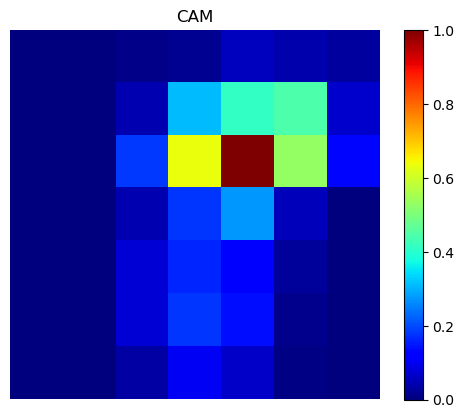

In [105]:
visualize_cam(cam_image)

In [ ]:
##########################################################
#원본 이미지와 CAM 이미지를 입력으로 받고 두 개의 이미지의 투명도를 조정, 하나의 이미지에서 원본과 CAM을 겹쳐 보여주는 visualize_cam_on_image() 함수를 만들어보세요.


In [106]:
def visualize_cam_on_image(cam_image, img, alpha=0.5):
    # CAM 크기를 원본 이미지 크기로 조정
    cam_resized = cv2.resize(cam_image, (img.shape[1], img.shape[0]))

    # CAM을 컬러 heatmap으로 변환 (cv2.applyColorMap는 BGR로 반환하므로 RGB로 변경)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # 원본 이미지와 heatmap을 alpha blending
    overlay = heatmap * alpha + img * (1 - alpha)
    overlay = overlay.astype(np.uint8)

    plt.figure(figsize=(8,8))
    plt.imshow(overlay)
    plt.title("CAM Overlay on Image")
    plt.axis('off')
    plt.show()

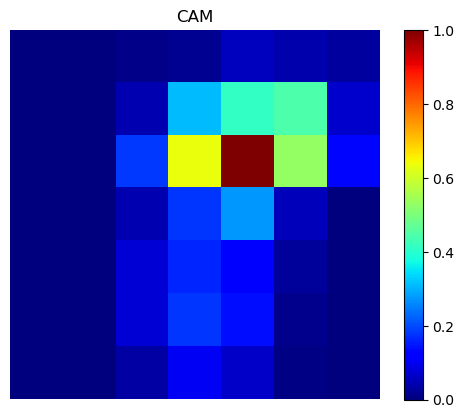

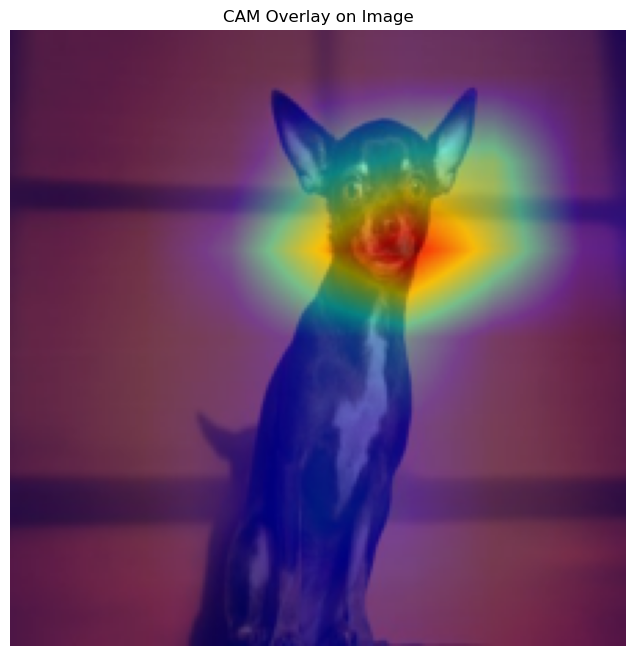

In [107]:
# 원본 이미지 복원
orig_img = unnormalize(image)

# CAM 단독 시각화
visualize_cam(cam_image)

# 원본 이미지 위에 CAM overlay 시각화
visualize_cam_on_image(cam_image, orig_img)

In [ ]:
##########################################################
#                   Grad-CAM 구현하기                    #
##########################################################

In [111]:
# 원하는 데이터를 골라서 진행해보세요
image, label, bbox = train_dataset[20]
sample_image = image.unsqueeze(0).to(device)

In [138]:
def generate_grad_cam1(model, image, target_layer_name):
    model.eval()    # 모델을 평가 모드로 설정
    features = {}   # feature map을 저장할 딕셔너리
    gradients = {}  # gradient를 저장할 딕셔너리

    # forward hook: 대상 레이어의 출력을 저장
    def forward_hook(module, input, output):    # forward hook 함수
        features['value'] = output.detach()     # feature map 저장

    # backward hook: 대상 레이어의 gradient를 저장
    def backward_hook(module, grad_in, grad_out):   # backward hook 함수
        gradients['value'] = grad_out[0].detach()   # gradient 저장

    # 모델 내에서 이름이 target_layer_name과 일치하는 레이어 검색
    target_layer = dict(model.named_modules()).get(target_layer_name, None) # target_layer_name에 해당하는 레이어
    if target_layer is None:    # target_layer가 없으면 에러 발생
        raise ValueError(f"Layer '{target_layer_name}' not found in the model.")    #   ValueError 발생

    # hook 등록
    forward_handle = target_layer.register_forward_hook(forward_hook)   # forward hook 등록
    backward_handle = target_layer.register_backward_hook(backward_hook)    # backward hook 등록

    # 순전파 실행
    output = model(image)   # forward pass
    pred_class = output.argmax(dim=1).item()    # 예측된 클래스 선택

    # 예측 클래스에 대해 backward 수행
    model.zero_grad()               # 기울기 초기화
    score = output[0, pred_class]   # 예측된 클래스 점수
    score.backward()                # backward pass

    # hook 제거
    forward_handle.remove()     # forward hook 제거
    backward_handle.remove()    # backward hook 제거

    # 저장된 feature map과 gradient 추출 (shape: [C, H, W])
    fmap = features['value'][0]     # feature map
    grads = gradients['value'][0]   # gradient

    # 각 채널에 대해 gradient의 global average pooling 계산 (weight 역할)
    weights = torch.mean(grads, dim=(1, 2)) # [C,]  # 채널별 평균값

    # weighted sum: 각 채널의 feature map에 weight를 곱해 합산
    grad_cam = torch.zeros(fmap.shape[1:], dtype=torch.float32, device=fmap.device) # [H, W]
    for i, w in enumerate(weights): # i: 채널 인덱스, w: 해당 채널의 weight
        grad_cam += w * fmap[i, :, :]   # weighted sum
    grad_cam = grad_cam.cpu().numpy()   # numpy 배열로 변환

    # ReLU 적용 및 정규화: 음수 값 제거 및 [0,1] 범위로 스케일링
    grad_cam = np.maximum(grad_cam, 0)  # ReLU
    grad_cam_image = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min() + 1e-8)   # 0~1 정규화

    return grad_cam_image 

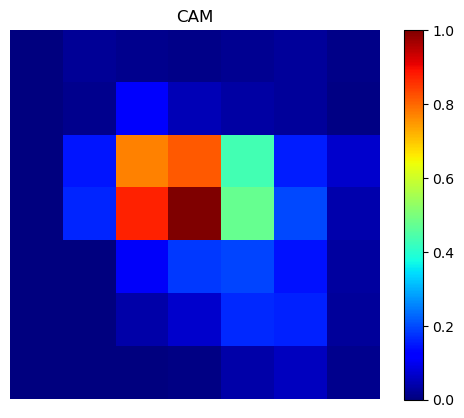

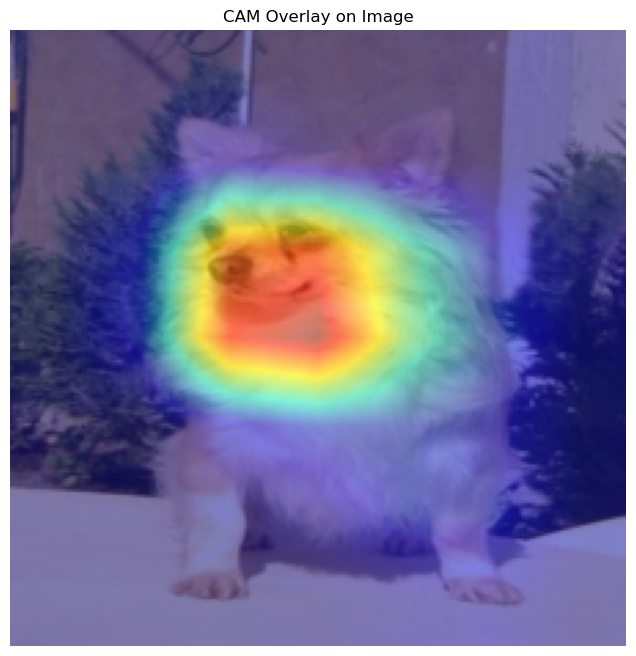

In [139]:
# layer4 사용
grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

# Grad-CAM 단독 시각화
visualize_cam(grad_cam_image )

# 전처리된 이미지를 원본 이미지로 복원 후 overlay 시각화
orig_img = unnormalize(image)
visualize_cam_on_image(grad_cam_image , orig_img)

In [114]:
##########################################################
#                   바운딩 박스 구하기                    #
##########################################################

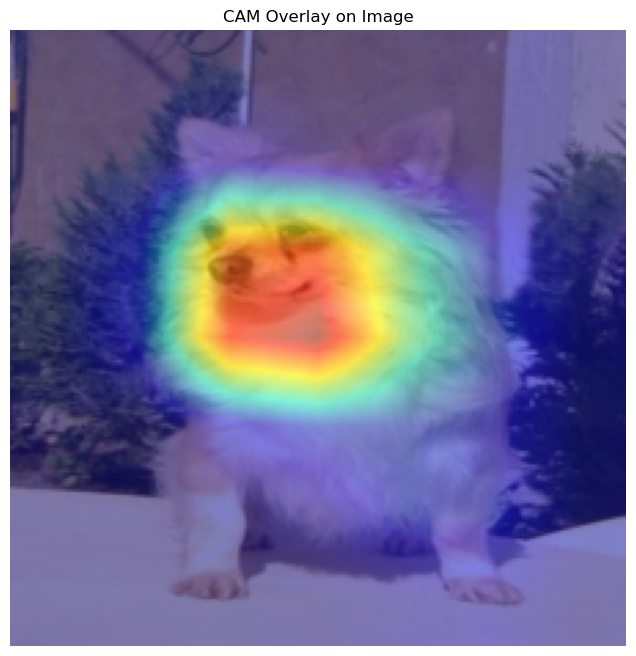

In [141]:
image, label, ground_bbox = train_dataset[21]
sample_image = image.unsqueeze(0).to(device)
orig_img = unnormalize(image)
grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

visualize_cam_on_image(grad_cam, orig_img)

In [142]:
def get_bbox(grad_cam_image, threshold=0.01):
    coords = np.argwhere(grad_cam_image > threshold)
    if coords.size == 0:
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    return (x_min, y_min, x_max, y_max)

In [143]:
cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))
bbox = get_bbox(cam_resized, threshold=0.5)

print(bbox)

(np.int64(63), np.int64(67), np.int64(142), np.int64(130))


In [144]:
def visualize_bbox_on_image(img, bbox, box_color=(255, 0, 0), thickness=2):
    # 원본 이미지 복사
    img_with_bbox = img.copy()
    if bbox is not None:
        x_min, y_min, x_max, y_max = bbox
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), box_color, thickness)
    else:
        print("활성화된 영역이 없습니다.")
    return img_with_bbox

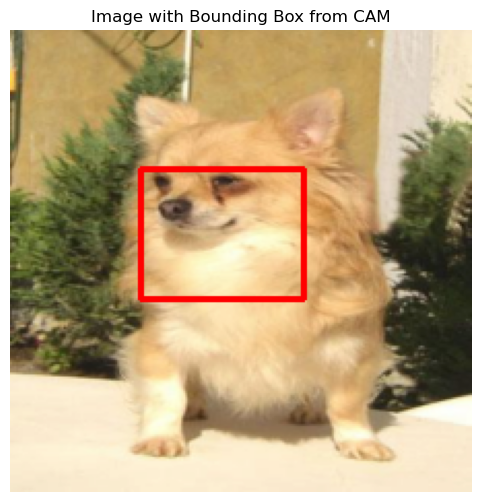

In [145]:
img_bbox = visualize_bbox_on_image(orig_img, bbox)

plt.figure(figsize=(6,6))
plt.imshow(img_bbox)
plt.title("Image with Bounding Box from CAM")
plt.axis("off")
plt.show()

In [146]:
ground_bbox

[48.53333333333334, 26.046511627906977, 185.92000000000002, 210.45581395348836]

In [ ]:
##########################################################
#                       IoU 구하기                       #
##########################################################

In [135]:
def get_iou(bbox1, bbox2):
    # bbox 중 하나라도 None이면 IoU 0.0
    if bbox1 is None or bbox2 is None:  # bbox가 None이면 IoU 0.0
        return 0.0  # bbox가 None이면 IoU 0.0

    x_min1, y_min1, x_max1, y_max1 = bbox1  # bbox1 좌표
    x_min2, y_min2, x_max2, y_max2 = bbox2  # bbox2 좌표

    # 두 bbox의 교집합 영역 좌표 계산
    x_min_inter = max(x_min1, x_min2)   # 교집합의 좌측 상단 x 좌표
    y_min_inter = max(y_min1, y_min2)   # 교집합의 좌측 상단 y 좌표
    x_max_inter = min(x_max1, x_max2)   # 교집합의 우측 하단 x 좌표
    y_max_inter = min(y_max1, y_max2)   # 교집합의 우측 하단 y 좌표

    # 교집합의 너비와 높이 (음수가 되지 않도록)
    inter_width = max(0, x_max_inter - x_min_inter) # 교집합의 너비
    inter_height = max(0, y_max_inter - y_min_inter)    # 교집합의 높이
    inter_area = inter_width * inter_height # 교집합 면적

    # 각 bbox의 면적 계산
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)   # bbox1 면적
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)   # bbox2 면적

    # 합집합 면적: A ∪ B = A + B - A ∩ B
    union_area = area1 + area2 - inter_area # 합집합 면적
    if union_area <= 0:
        return 0.0

    iou = inter_area / union_area   # IoU 계산
    return iou

In [136]:
get_iou(bbox, ground_bbox)  # IoU 계산  

np.float64(0.157013634776405)

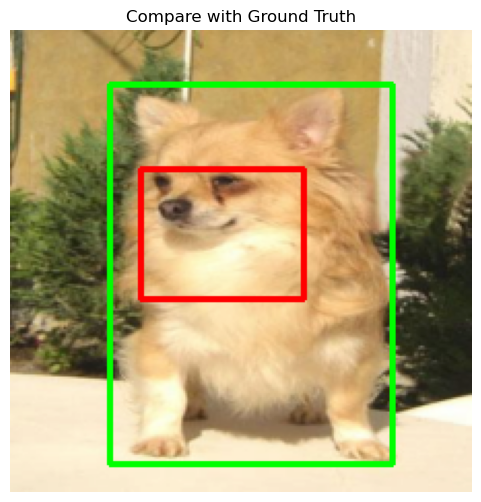

In [162]:
def visualize_both_bbox_on_image(img, bbox, ground_truth, thickness=2): 
    # 원본 이미지 복사
    img_with_bbox = img.copy()

    x_min, y_min, x_max, y_max = bbox   # 예측된 bbox 좌표  
    cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), thickness)    # 파란색 사각형

    x_min_t, y_min_t, x_max_t, y_max_t = ground_truth   # 실제 bbox 좌표
    cv2.rectangle(img_with_bbox, (x_min_t, y_min_t), (x_max_t, y_max_t), (0, 255, 0), thickness)    # 초록색 사각형

    return img_with_bbox    

ground_truth = [int(x) for x in ground_bbox]    # 실제 bbox 좌표 (정수형으로 변환)

img_bbox = visualize_both_bbox_on_image(orig_img, bbox, ground_truth)   # 두 bbox 시각화

plt.figure(figsize=(6,6))   # 두 bbox 시각화
plt.imshow(img_bbox)    # 이미지 출력
plt.title("Compare with Ground Truth")  # 제목 설정
plt.axis("off")  # 축 제거
plt.show()  #이미지 출력

In [ ]:
############# CAM IOU 구하기 #################

In [154]:
def get_bbox_CAM(cam_image, threshold=0.01):
    coords = np.argwhere(cam_image > threshold)
    if coords.size == 0:
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)
    return (x_min, y_min, x_max, y_max)

In [155]:
cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))
bbox_CAM = get_bbox_CAM(cam_resized, threshold=0.5)

print(bbox_CAM)

(np.int64(63), np.int64(67), np.int64(142), np.int64(130))


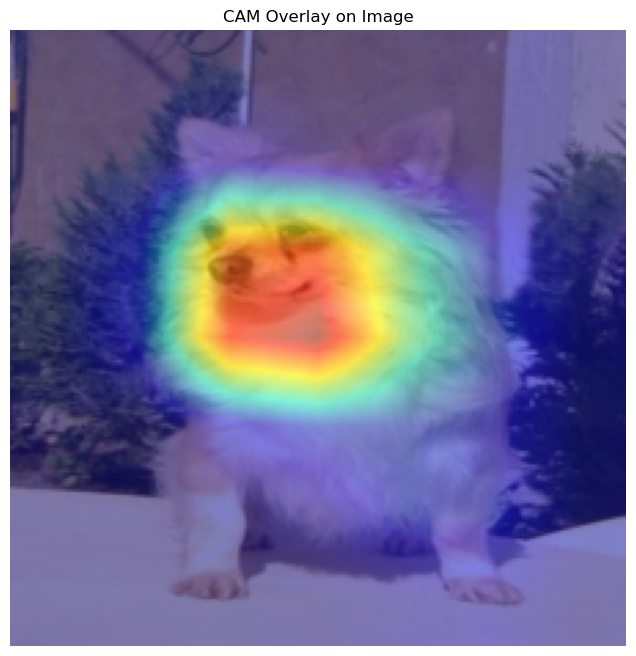

In [148]:
image, label, ground_bbox = train_dataset[21]
sample_image = image.unsqueeze(0).to(device)
orig_img = unnormalize(image)
cam_image = generate_cam(model, sample_image) # 일반 CAM 사용

visualize_cam_on_image(cam_image, orig_img)

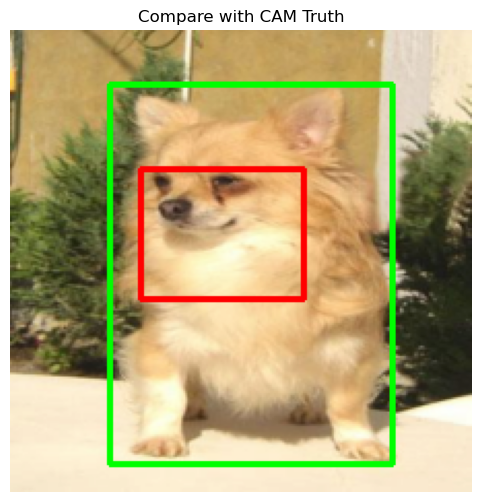

In [156]:
ground_truth = [int(x) for x in ground_bbox]    # 실제 bbox 좌표 (정수형으로 변환)

img_bbox = visualize_both_bbox_on_image(orig_img, bbox_CAM, ground_truth)   # 두 bbox 시각화

plt.figure(figsize=(6,6))   # 두 bbox 시각화
plt.imshow(img_bbox)    # 이미지 출력
plt.title("Compare with CAM Truth")  # 제목 설정
plt.axis("off")  # 축 제거
plt.show()  #이미지 출력

In [151]:
get_iou(bbox, ground_bbox)  # IoU 계산  

np.float64(0.1964446607044162)

In [157]:
##############################################################
# 21번 이미지의 CAM과 Grad-CAM의 IoU 계산 결과
# CAM 0.1964446607044162
# Grad-CAM 0.157013634776405
# Grad-CAM이 일반적으로 성능이 더 좋다고 했는데 결과는 그렇지 않다
# 1가지 케이스만 봐서 그런가? 좀더 많은 케이스를 봐야 겠다.

(np.int64(54), np.int64(57), np.int64(163), np.int64(138))
계산된 CAM IoU 값: 0.3485
(np.int64(63), np.int64(67), np.int64(142), np.int64(130))
계산된 CAM IoU 값: 0.1964


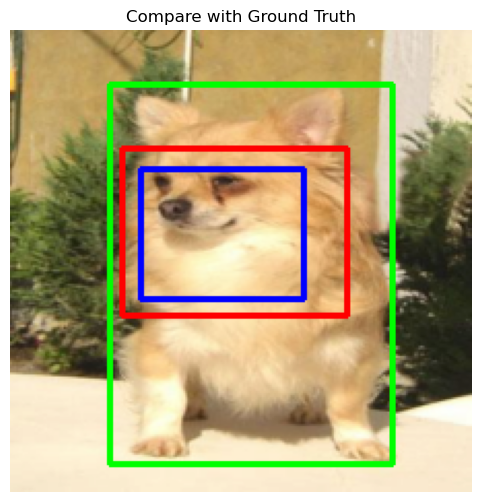

In [170]:
###############################################################################
# 이번에는 CAM과 Gred-CAM의 영역을 하나의 이미지에 동시에 그리고 
# IoU를 각각 계산하는 것을 짜보자
###############################################################################
image, label, ground_bbox = train_dataset[21]   # 21번째 샘플 선택
sample_image = image.unsqueeze(0).to(device)    # 배치 차원 추가
orig_img = unnormalize(image)   # 원본 이미지 복원
grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")    # Grad-CAM 생성


def get_bbox(grad_cam_image, threshold=0.01):   # Grad-CAM에서 bbox 추출
    coords = np.argwhere(grad_cam_image > threshold)    # threshold 이상인 좌표 찾기
    if coords.size == 0:
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min, x_min = coords.min(axis=0)   # 최소 좌표
    y_max, x_max = coords.max(axis=0)   # 최대 좌표
    return (x_min, y_min, x_max, y_max) # Grad-CAM bbox 좌표 반환


cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))    # Grad-CAM 크기를 원본 이미지 크기로 조정
bbox = get_bbox(cam_resized, threshold=0.3) # Grad-CAM에서 bbox 추출

print(bbox)  # Grad-CAM bbox 좌표 출력

def visualize_bbox_on_image(img, bbox, box_color=(255, 0, 0), thickness=2): #   이미지에 bbox 시각화
    # 원본 이미지 복사
    img_with_bbox = img.copy()  # 원본 이미지 복사
    if bbox is not None:    # bbox가 None이 아니면 사각형 그리기
        x_min, y_min, x_max, y_max = bbox   # bbox 좌표
        cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), box_color, thickness)  # 사각형 그리기
    else:
        print("활성화된 영역이 없습니다.")  # bbox가 None이면 메시지 출력
    return img_with_bbox    # 이미지 반환

def get_iou(bbox1, bbox2):
    # bbox 중 하나라도 None이면 IoU 0.0
    if bbox1 is None or bbox2 is None:  # bbox가 None이면 IoU 0.0
        return 0.0  # bbox가 None이면 IoU 0.0

    x_min1, y_min1, x_max1, y_max1 = bbox1  # bbox1 좌표
    x_min2, y_min2, x_max2, y_max2 = bbox2  # bbox2 좌표

    # 두 bbox의 교집합 영역 좌표 계산
    x_min_inter = max(x_min1, x_min2)   # 교집합의 좌측 상단 x 좌표
    y_min_inter = max(y_min1, y_min2)   # 교집합의 좌측 상단 y 좌표
    x_max_inter = min(x_max1, x_max2)   # 교집합의 우측 하단 x 좌표
    y_max_inter = min(y_max1, y_max2)   # 교집합의 우측 하단 y 좌표

    # 교집합의 너비와 높이 (음수가 되지 않도록)
    inter_width = max(0, x_max_inter - x_min_inter) # 교집합의 너비
    inter_height = max(0, y_max_inter - y_min_inter)    # 교집합의 높이
    inter_area = inter_width * inter_height # 교집합 면적

    # 각 bbox의 면적 계산
    area1 = (x_max1 - x_min1) * (y_max1 - y_min1)   # bbox1 면적
    area2 = (x_max2 - x_min2) * (y_max2 - y_min2)   # bbox2 면적

    # 합집합 면적: A ∪ B = A + B - A ∩ B
    union_area = area1 + area2 - inter_area # 합집합 면적
    if union_area <= 0:
        return 0.0

    iou = inter_area / union_area   # IoU 계산
    return iou

iou_grad = get_iou(bbox, ground_bbox)  # CAM IoU 계산
print(f"계산된 CAM IoU 값: {iou_grad:.4f}")

def get_bbox_CAM(cam_image, threshold=0.01):    # CAM에서 bbox 추출
    coords = np.argwhere(cam_image > threshold)  # threshold 이상인 좌표 찾기
    if coords.size == 0:    # coords가 없으면 None
        return None
    # np.argwhere의 결과는 (row, col) 즉, (y, x) 순서입니다.
    y_min_c, x_min_c = coords.min(axis=0)   # 최소 좌표
    y_max_c, x_max_c = coords.max(axis=0)   # 최대 좌표
    return (x_min_c, y_min_c, x_max_c, y_max_c)  # bbox 좌표 반환

cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))
bbox_CAM = get_bbox_CAM(cam_resized, threshold=0.5)  # CAM에서 bbox 추출

print(bbox_CAM)  # CAM bbox 좌표 출력
iou_CAM = get_iou(bbox_CAM, ground_bbox)  # CAM IoU 계산
print(f"계산된 CAM IoU 값: {iou_CAM:.4f}")


def visualize_both_bbox_on_image(img, bbox, bbox_CAM, ground_truth, thickness=2): 
    # 원본 이미지 복사
    img_with_bbox = img.copy()

    x_min_c, y_min_c, x_max_c, y_max_c = bbox_CAM   # 예측된 CAM bbox 좌표  
    cv2.rectangle(img_with_bbox, (x_min_c, y_min_c), (x_max_c, y_max_c), (0, 0, 255), thickness)    # 녹색 사각형 

    x_min, y_min, x_max, y_max = bbox   # 예측된 graed CAM bbox 좌표  
    cv2.rectangle(img_with_bbox, (x_min, y_min), (x_max, y_max), (255, 0, 0), thickness)    # 파란색 사각형

    x_min_t, y_min_t, x_max_t, y_max_t = ground_truth   # 실제 bbox 좌표
    cv2.rectangle(img_with_bbox, (x_min_t, y_min_t), (x_max_t, y_max_t), (0, 255, 0), thickness)    # 초록색 사각형

    return img_with_bbox    

ground_truth = [int(x) for x in ground_bbox]    # 실제 bbox 좌표 (정수형으로 변환)

img_bbox = visualize_both_bbox_on_image(orig_img, bbox, bbox_CAM, ground_truth)   # 두 bbox 시각화

plt.figure(figsize=(6,6))   # 두 bbox 시각화
plt.imshow(img_bbox)    # 이미지 출력
plt.title("Compare with Ground Truth")  # 제목 설정
plt.axis("off")  # 축 제거
plt.show()  #이미지 출력

In [ ]:
###############################################################################
# 주어진 코드를 기반으로 CAM (Class Activation Map) 및 Grad-CAM의 바운딩 박스를 10개의 이미지에 대해 시각화하고
# 각각의 IoU (Intersection over Union) 값을 그래프로 나타내는 코드를 작성해보자
###############################################################################

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


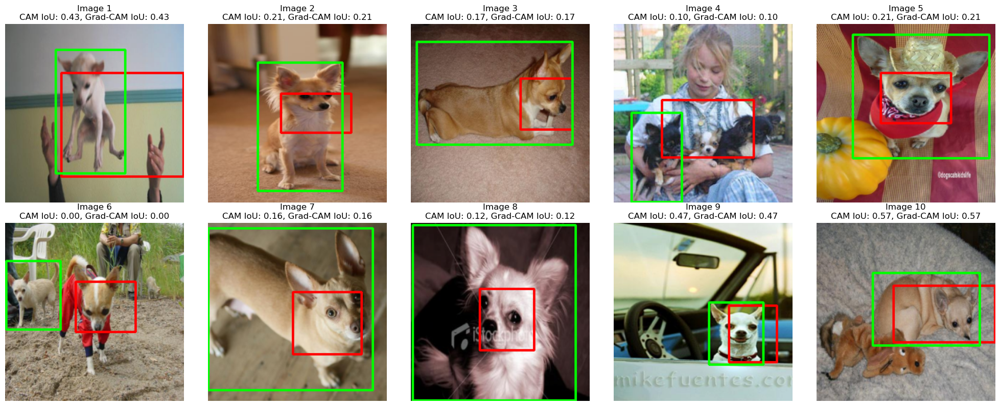

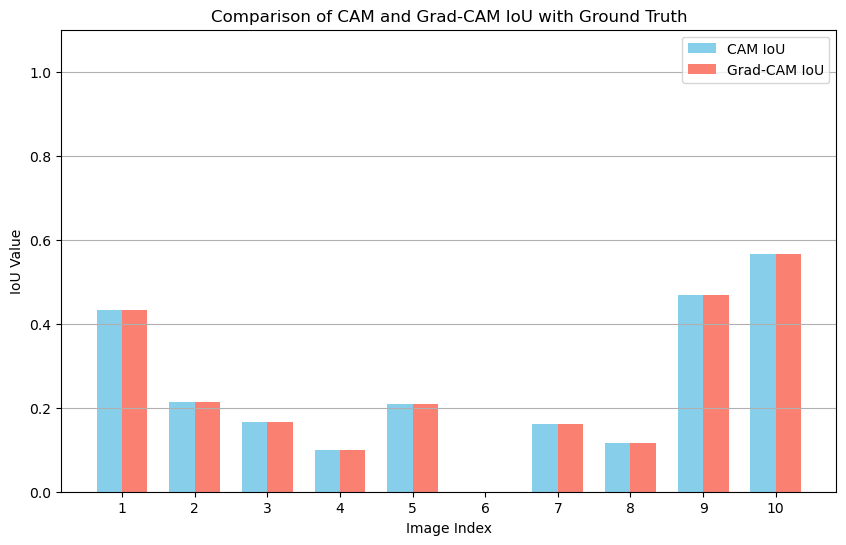

In [172]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
## Gemini를 통해 
# 함수 정의 (기존 코드에서 사용된 함수들)
# 필요한 경우, 이 함수들을 상단에 추가하거나, 해당 파일에 이미 정의되어 있는지 확인하세요.
# 예시:
# def get_bbox(grad_cam_image, threshold=0.01):
#     coords = np.argwhere(grad_cam_image > threshold)
#     if coords.size == 0:
#         return None
#     y_min, x_min = coords.min(axis=0)
#     y_max, x_max = coords.max(axis=0)
#     return (x_min, y_min, x_max, y_max)

# def get_iou(bbox1, bbox2):
#     if bbox1 is None or bbox2 is None:
#         return 0.0
#     x_min1, y_min1, x_max1, y_max1 = bbox1
#     x_min2, y_min2, x_max2, y_max2 = bbox2
#     x_min_inter = max(x_min1, x_min2)
#     y_min_inter = max(y_min1, y_min2)
#     x_max_inter = min(x_max1, x_max2)
#     y_max_inter = min(y_max1, y_max2)
#     inter_width = max(0, x_max_inter - x_min_inter)
#     inter_height = max(0, y_max_inter - y_min_inter)
#     inter_area = inter_width * inter_height
#     area1 = (x_max1 - x_min1) * (y_max1 - y_min1)
#     area2 = (x_max2 - x_min2) * (y_max2 - y_min2)
#     union_area = area1 + area2 - inter_area
#     if union_area <= 0:
#         return 0.0
#     return inter_area / union_area

def visualize_multiple_bboxes(img, bboxes, thickness=2):
    """
    여러 개의 바운딩 박스를 이미지에 시각화합니다.
    Args:
        img (np.array): 원본 이미지
        bboxes (list): (bbox, color) 튜플 리스트
    """
    img_with_bboxes = img.copy()
    for bbox, color in bboxes:
        if bbox is not None:
            x_min, y_min, x_max, y_max = bbox
            cv2.rectangle(img_with_bboxes, (x_min, y_min), (x_max, y_max), color, thickness)
    return img_with_bboxes

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.5)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

In [ ]:
###############################################################################
# 10개의 이미지에 대한 CAM과 Grad-CAM의 IoU 값은 변화가 없었다.
# 이는 Grad-CAM이 layer4에서는 CAM과동일한 값을 나타내는 것으로 보인다.
# 그렇다면 layer3으로 변경하고 해보자
###############################################################################

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


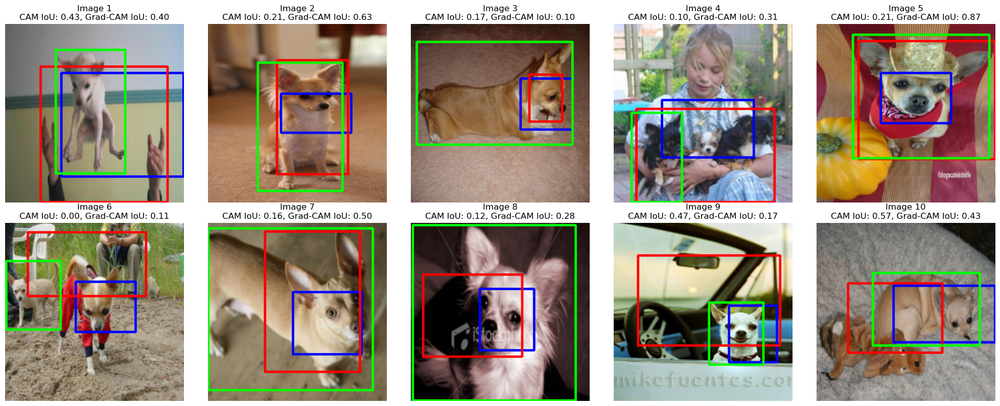

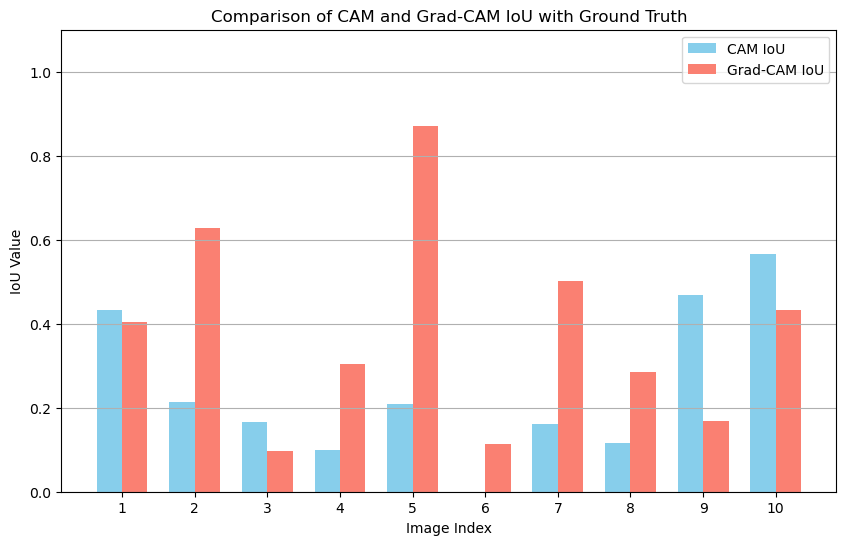

In [173]:
# 그렇다면 layer3으로 변경

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer3")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.5)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

In [ ]:
###############################################################################
# layer3으로 변경하고 보면 유의 미한 차이가 있었다.
# 하지만 IoU 값은 일정한 경향성이 없이 크고 작고를 반복하는 현상을 볼 수 있었다.
# 그럼 threshold=0.5 값을 변경하면 어떤 효과가 있을지 비교해 보자
###############################################################################

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


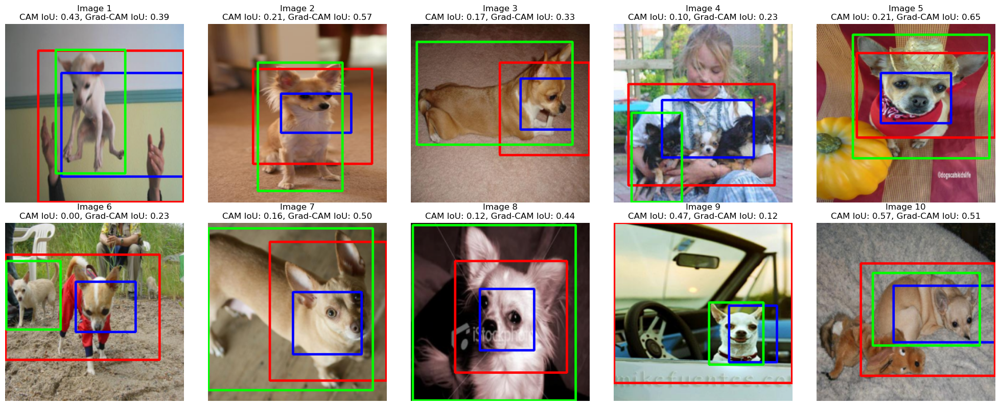

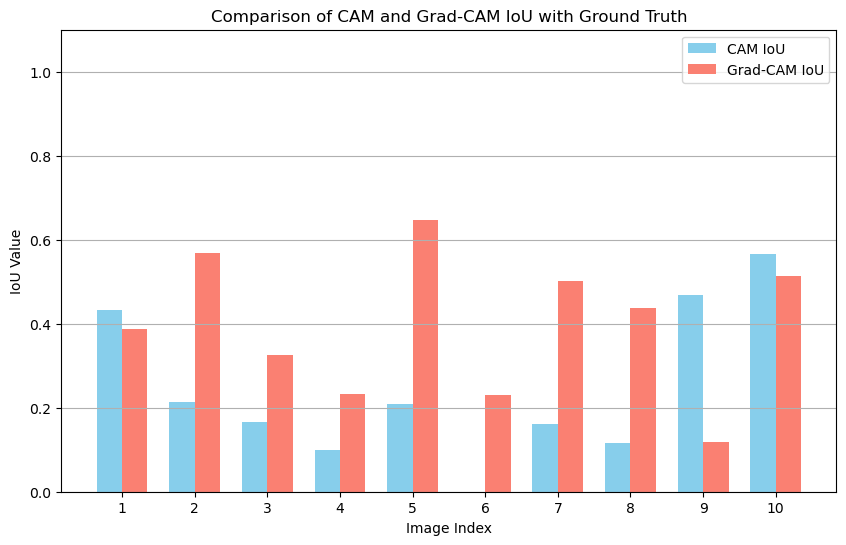

In [177]:
# GradCAM threshold=0.1

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious1 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.1)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious1.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious1, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

In [ ]:
###############################################################################
# threshold 값의 변화에 따른 변화를 확인해 보았다
# 전반적으로 0.1의 낮은 threshold 값을 가진때 가장 높은 IoU 값을 보였다.
# 하지만 그렇지 않은 경우도 있었다.
# 0.1~0.8까지의 변화를 그래프로 그려보자
###############################################################################

In [185]:
# 각 값이 어떻게 구성되어 있는지 확인한다.
print(grad_cam_ious8)

[np.float64(0.08209121245828699), np.float64(0.05343958748388609), np.float64(0.03204134366925065), np.float64(0.0), np.float64(0.07651386530843238), np.float64(0.0), np.float64(0.051652398488689084), np.float64(0.027072192513368985), np.float64(0.11199095022624435), np.float64(0.14982778415614237)]


## 결론
대부분의 경우 Ground Truth box가 개의 몸통을 포함하기 때문에 box가 큰 경향이 있다. 그리고 CAM을 이용한 box는 개의 얼굴이나 일부분을 주로 잡기 때문에 전반적으로는 threshold 값이 낮으면 IoU 값이 높아지는 것으로 보인다.
그러나 개의 몸통을 제외한 얼굴 부분만 있거나 모델 성능이 낮아 엉뚱한 부분을 찾는 경우 또 히려 모델 성능이 좋아 잘 찾는 경우에 따라서 IoU 값은 매우 달라지게 된다.
따라서 IoU 값으로 사람 대비 일반화 성능을 판단하기는 어려울 것 같다.


## 회고
이번에는 최대한 코드를 이해하면서 결과를 뽑기위해 노력해 봤다.
모델을 더 잘 훈련 시키고 했으면 다른 결론이 났을까? 그렇지 않을 것 같다.
이전에 회사에서 무지성 학습을 돌릴때는 이런 개념이 전혀 없어 CAM을 볼 수 있는
생각을 못했었다.
그러나 이렇게 CAM으로 보면 쉽게 학습이 얼마나 잘 되었는지를 판단 할 수 있을 것 같아 이후에 활용이 기대된다.